# Modèle génératif pour la classification précoce de séries temporelles

## Présentation du modèle

Le jeu de données simulées :
* 2499 observations
* 1791 observations d'entraînement et 708 de test
* données en deux dimensions
* mixture de 3 gaussiennes de moyennes (5, 5), (5, -5) et (-5, -5) et de matrices de covariances identité
* trois classes en fonction des poids dans la mixture :
* * classe 1 : (0,2, 0,7, 0,1)
* * classe 2 : (0,2, 0,2, 0,6)
* * classe 3 : (0,2, 0,4, 0,4)

Le modèle :
* époques : 4.000
* mise à une échelle normalisée des données : oui
* mise à une échelle normalisé des batchs : non
* taille des batchs : 256
* taux d'apprentissage : 0,0005
* équilibre des fonctions de coût : 0,001
* drop out : 0,5
* clipping : 0,5
* dimension des couches cachées : 16
* nombre de mixtures : 5

fonctions de coût :
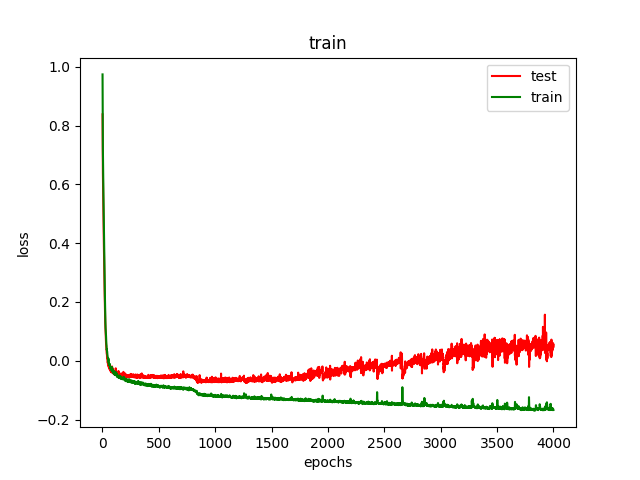

fonction de coût de la classification :
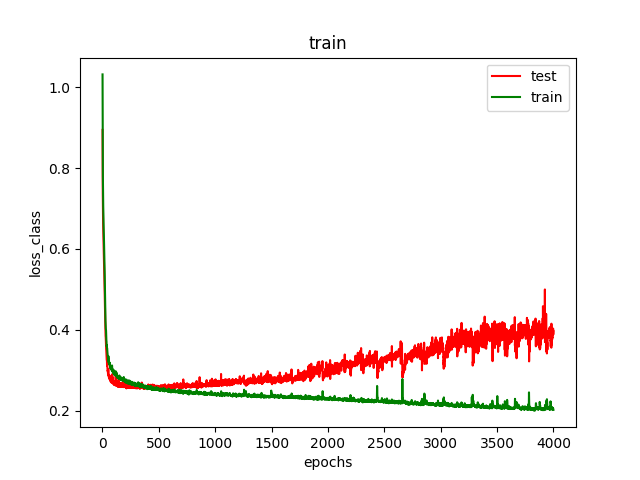

fonction de coût de la génération :
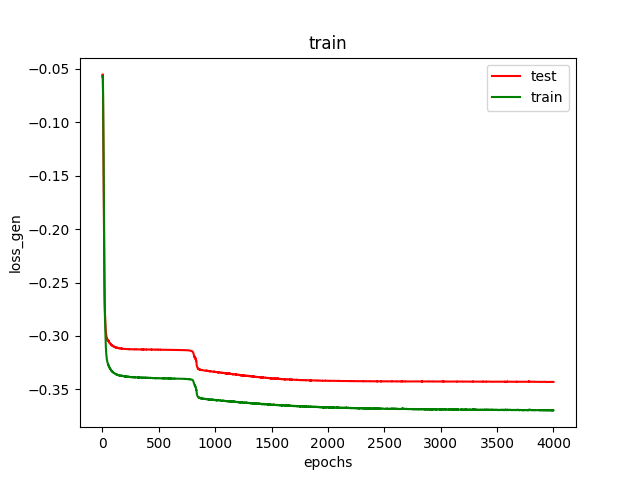

La fonction de coût de la classification montre que la coubre du test décroche progressivement de celle de l'entraînement. 
La fonction de coût de la génération quant à elle continue de décroître. le test suit l'entraînement.

## Les paramètres à la sortie du modèle convergent-ils avec succès vers les paramètres des lois gaussiennes utilisées lors de la création des données ?

Si l'on regarde la sortie du modèle à 4.000 époques, en particulier les paramètres des gaussiennes composant la mixture ainsi que leurs poids respectifs on peut observer si la partie générative du modèle a réussi à estimer correctement les paramètres des lois dont sont issues les données. A noter que la mise à l'échelle des données ramène les moyennes autour de l'unité ou de son inverse. On affiche par pas de temps de la série, l'évolution des paramètres :

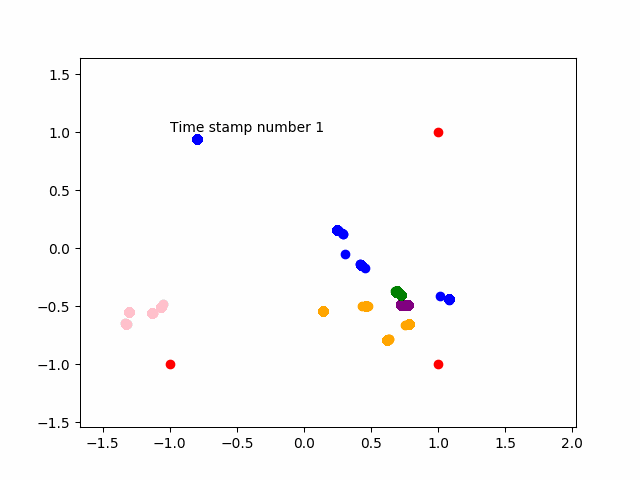

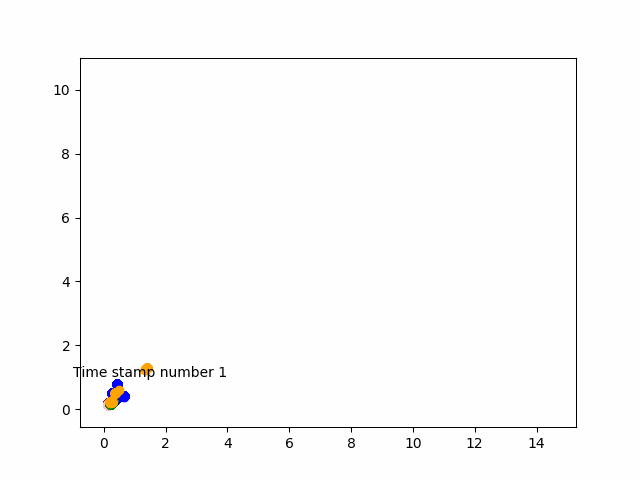

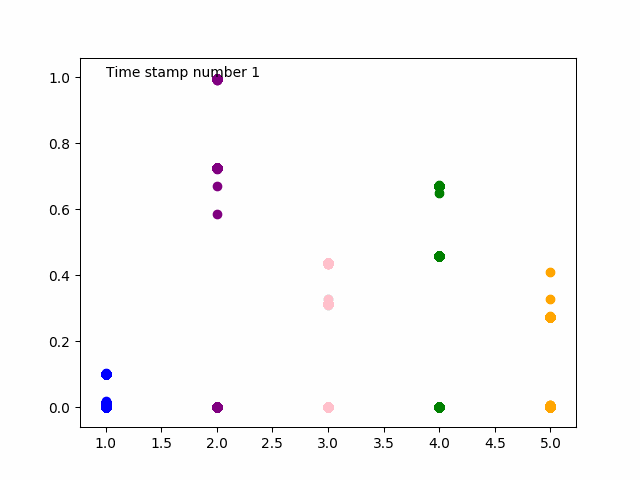

Les mixtures les plus volatiles autant sur la moyenne que sur la variance sont aussi celles avec des poids faibles voir nuls.

En ce concentrant sur les trois autres mixtures :

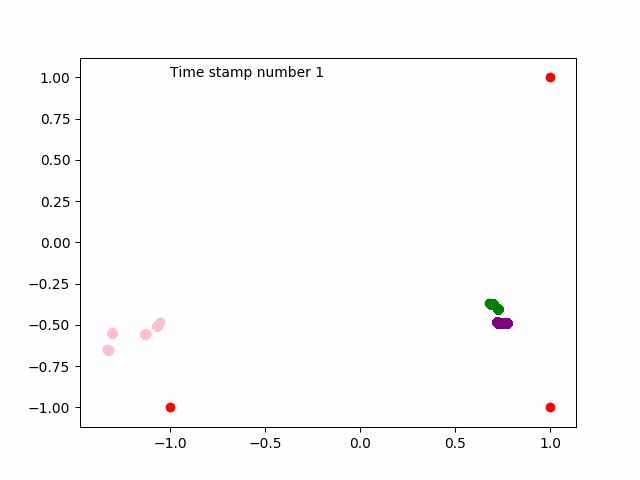

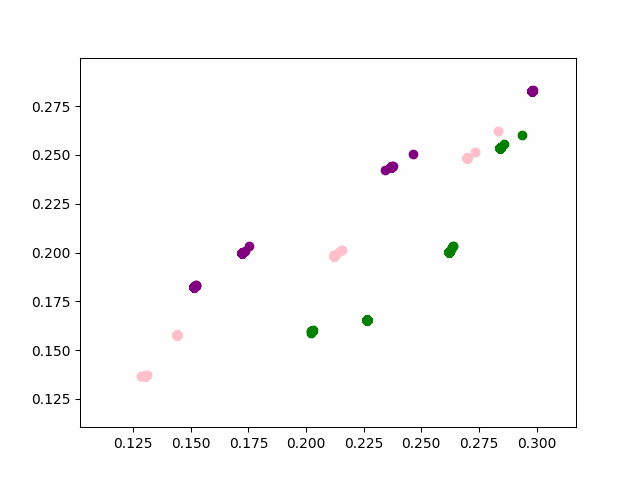

Les trois mixtures restantes ne convergent pas vers les points représentant les moyennes des gaussiennes ni vers le point (1, 1) de la variance. De plus les mixtures verte et violette ont une moyenne presque identique. 

Il apparait qu'une seule des deux dimensions des données est couverte correctement par la génération puisque la gaussienne rose ((-1,1, -0,5),(0,15, 0,15)) couvre les gaussiennes de moyenne (-1, X). Les gaussiennes verte ((0,9, -0,25), (0,225, 0,175)) et violette ((0,9, -0,5), (0,175, 0,2)) quant à elles couvrent les gaussiennes de moyenne (1, X). Une hypothèse est que discriminer les séries sur une dimension seulement est suffisante pour permettre de séparer les classes. Il pourrait être intéressant de simuler des données avec une quatrième gaussienne de moyenne (-5, 5) et des classes couvrant les deux dimensions.

## Performance sur la classification

On classifie l'ensemble des séries du jeu de teste. La classification pour chaque série fonctionne de la façon suivante : 
* Un seuil de confiance est fixé
* La série incomplète est classifiée et la classe ayant la probabilité de classification la plus haute est gardée en mémoire (classe cible)
* Une (ou plusieurs) génération de la fin de la série est proposée
* Si la probabilité (la moyenne des probabilités) de classifier la série selon la classe cible est supérieure au seuil fixé, la série est classifiée sinon il faut attendre un temps supplémentaire

On fait varier le seuil de classification pour une seule génération

Seuil fixé à 0, il s'agit de la précision du modèle pouor chaque temps dans la série :

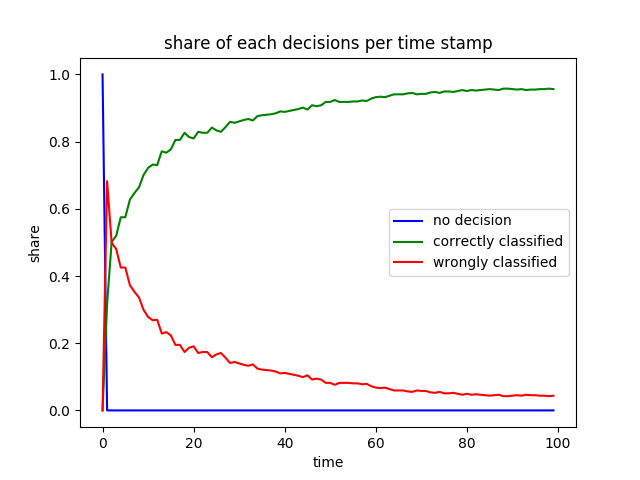

Seuil fixé à 0,2 :

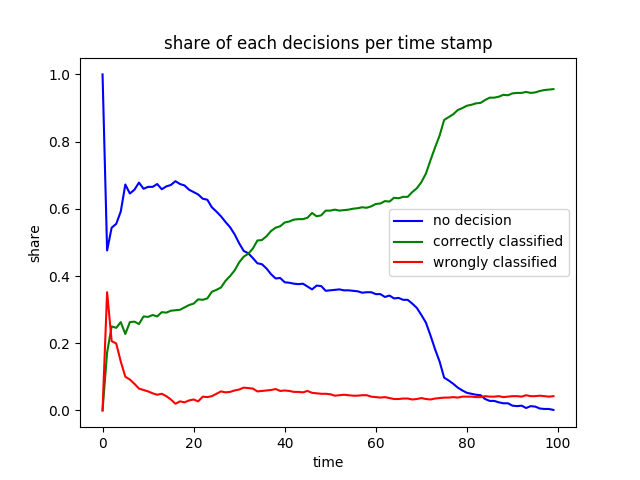

Seuil fixé à 0,4 :

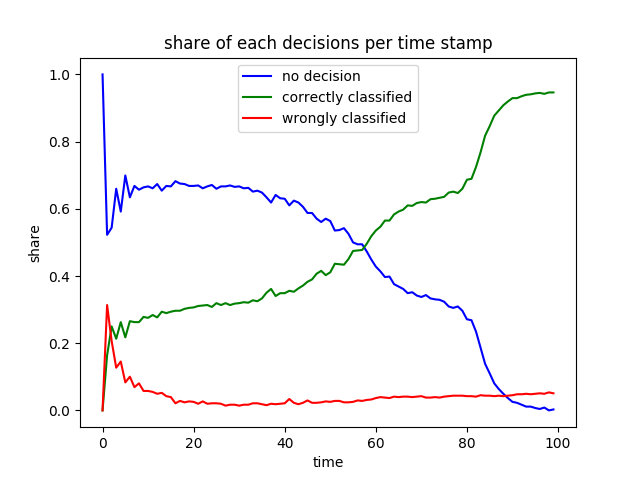

Seuil fixé à 0,6 :

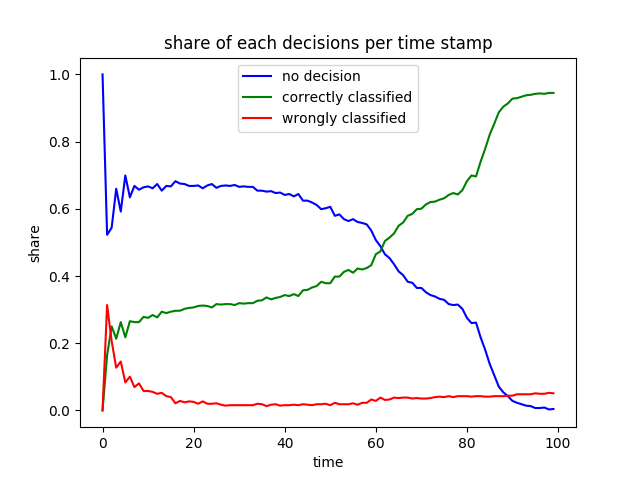

Seuil fixé à 0,8 :

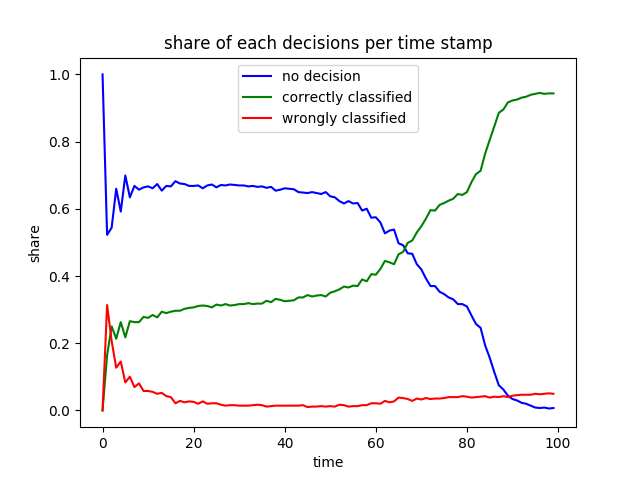

Bien que le taux de bonne classification monte rapidement (envrion 80% au temps 20), le modèle ne répercute pas ces performances dans ses prises de décision. Même quand le seuil fixé par l'utilisateur est à 0,2 (extrêmement faible pour 3 classes) le temps de prise de décision dépasse les 50% peu après le temps 30. Il recule ensuite logiquement quand le seuil augmente. Mis en perspective par rapport à la qualité de l'apprentissage des poids des gaussiennes, ce manque d'entrain face à la décision se comprend comme la difficulté du modèle à correctement classifier des séries dès lors qu'elles sont générées par des poids différents de ceux ayant servis à générer les données.